# Brain Tumor Detection using YOLOv8 (custom training)

Computer vision is a field of artificial intelligence that focuses on teaching computers to interpret and understand visual information. One popular and powerful technique used in computer vision for object detection is called YOLO, which stands for "You Only Look Once".

YOLO aims to identify and locate objects in an image or video stream in real-time. Unlike traditional methods that rely on complex pipelines and multiple passes, YOLO takes a different approach by treating object detection as a single regression problem.


### 2. Description:
To detect brain tumor such as:

- Tumor
Dataset used contains only one class i.e., tumor

### 3. 	Problem Statement:
The goal of this project is to develop an AI-based system for detecting brain tumors from MRI scans using Convolutional Neural Network (CNN). The system will utilize CNN to accurately identify brain tumor, assisting radiologists and medical professionals in early diagnosis and treatment planning


### 4.	Instructions:
1. Use Google Colab with runtime as T4GPU.




In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile # This line imports the zipfile module
zip_path = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8.zip'
extract_path = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-6-11f049940eef>", line 5, in <cell line: 0>
    zip_ref.extractall(extract_path)
  File "/usr/lib/python3.11/zipfile.py", line 1702, in extractall
    self._extract_member(zipinfo, path, pwd)
  File "/usr/lib/python3.11/zipfile.py", line 1756, in _extract_member
    open(targetpath, "wb") as target:
    ^^^^^^^^^^^^^^^^^^^^^^
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
          ^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred

TypeError: object of type 'NoneType' has no len()

2. Import all the necessary libraries including  Ultralytics and image visualization

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 761.5 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [3]:
import os,random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [ ]:
import cv2

In [ ]:
import torch

In [ ]:
!pip install Pillow

In [ ]:
import os
from PIL import Image

In [ ]:
!pip install --upgrade ultralytics ray==2.32.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 MB 8.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


4. Display the images to check whether dataset has been correctly uploaded or not
- Define the directory containing images
- Set the number of samples to display
- Get the list of all image files in the directory
- Randomly select num_samples images
- Create a 3x3 subplot
- Loop through each randomly selected image and display it

In [ ]:
def convert_images_to_rgb(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                image_path = os.path.join(root, file)
                try:
                    img = Image.open(image_path)
                    img_rgb = img.convert('RGB')
                    img_rgb.save(image_path)
                    print(f"Converted {file} to RGB")
                except Exception as e:
                    print(f"Warning: Could not convert {file} to RGB. Error: {e}")

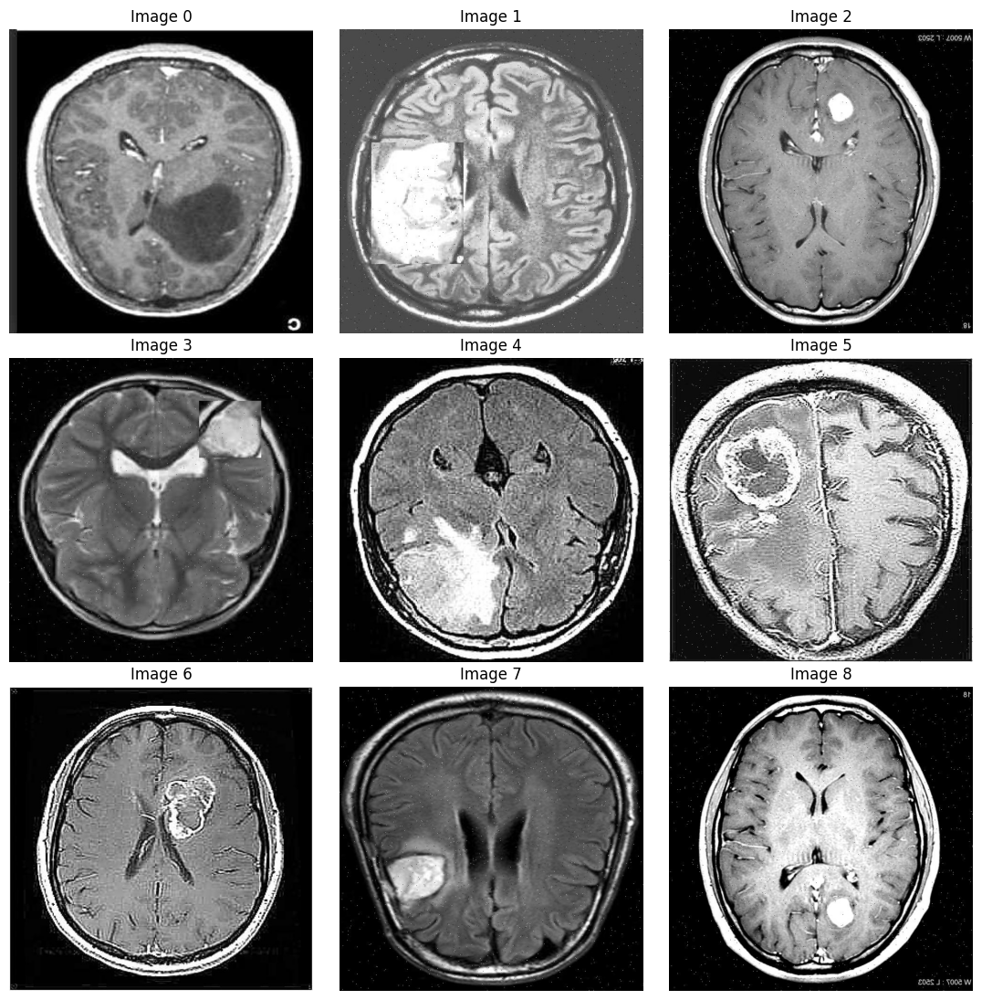

In [4]:
image_directory = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images'

num_sample = 9

image_files = os.listdir(image_directory)

random_images = random.sample(image_files,num_sample)

fig ,axes = plt.subplots(3,3,figsize=(11,11))

for i in range(num_sample):
  ax = axes[i//3,i%3]
  ax.imshow(mpimg.imread(os.path.join(image_directory,random_images[i])))
  ax.axis('off')
  ax.set_title(f'Image {i}')
  plt.tight_layout()


plt.show()

In [ ]:
# shape of single image

mpimg.imread(os.path.join(image_directory,random_images[6])).shape

(640, 640, 3)

5. Download YOLOv8 and run Inference on a random image

In [ ]:
image_dr = os.path.join(image_directory,random_images[0])
image_dr

'/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y476_jpg.rf.bbc02c7daa025eb44fc9f864fb7050bd.jpg'

In [4]:
import os
from collections import defaultdict

# Define the path to your dataset annotations
annotations_path = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/labels'

# Initialize a dictionary to store counts
label_counts = defaultdict(int)

# Iterate over all annotation files
for file in os.listdir(annotations_path):
    if file.endswith(".txt"):
        file_path = os.path.join(annotations_path, file)
        with open(file_path, "r") as f:
            for line in f:
                class_id = line.strip().split()[0]  # Get the class ID
                label_counts[class_id] += 1

# Print the results
for label, count in label_counts.items():
    print(f"Label {label}: {count} occurrences")


Label 0: 2748 occurrences


In [ ]:
yolo_model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 77.5MB/s]


In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt source='/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y424_jpg.rf.35c1baa4ae87ff74e91ecaf4a0c21537.jpg'

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y424_jpg.rf.35c1baa4ae87ff74e91ecaf4a0c21537.jpg: 640x640 (no detections), 11.9ms
Speed: 3.1ms preprocess, 11.9ms inference, 88.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


### 6. Now train YOLOv8 on Custom data

In [ ]:
import ray
print(ray.__version__)

2.32.0


In [ ]:
Result_Final_model2 = yolo_model.train(data="/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/data.yaml",epochs = 16,batch =-1, optimizer = 'auto')

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/data.yaml, epochs=16, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

100%|██████████| 755k/755k [00:00<00:00, 17.7MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 100MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/labels.cache... 2765 images, 153 backgrounds, 1 corrupt: 100%|██████████| 2766/2766 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg'


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.10G reserved, 0.06G allocated, 14.58G free


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     3011043       8.194         0.382         57.92         324.9        (1, 3, 640, 640)                    list
     3011043       16.39         0.531         38.55         90.47        (2, 3, 640, 640)                    list
     3011043       32.78         0.858         23.94         90.25        (4, 3, 640, 640)                    list
     3011043       65.55         1.424         30.51         89.79        (8, 3, 640, 640)                    list
     3011043       131.1         2.529         51.03           104       (16, 3, 640, 640)                    list
AutoBatch: Using batch-size 107 for CUDA:0 8.90G/14.74G (60%) ✅


train: Scanning /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/labels.cache... 2765 images, 153 backgrounds, 1 corrupt: 100%|██████████| 2766/2766 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg'
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/valid/labels.cache... 184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0008359375), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 16 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/16      12.3G      1.036       2.72      1.265        169        640: 100%|██████████| 26/26 [10:07<00:00, 23.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.31s/it]

                   all        184        195      0.959      0.364      0.718      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/16      12.3G      0.846      1.456      1.075        156        640: 100%|██████████| 26/26 [01:03<00:00,  2.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]

                   all        184        195      0.777       0.59      0.661      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/16      12.4G     0.8317      1.221      1.055        148        640: 100%|██████████| 26/26 [01:05<00:00,  2.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]

                   all        184        195      0.247      0.108     0.0924     0.0428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/16      12.3G     0.8567      1.072      1.073        161        640: 100%|██████████| 26/26 [01:04<00:00,  2.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


                   all        184        195       0.58     0.0285      0.068     0.0374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/16      12.3G     0.8226     0.9184      1.058        152        640: 100%|██████████| 26/26 [01:03<00:00,  2.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]

                   all        184        195      0.399      0.382      0.365      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/16      12.3G      0.803     0.8363      1.043        169        640: 100%|██████████| 26/26 [01:06<00:00,  2.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]

                   all        184        195      0.355      0.262      0.233      0.138


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/16      12.3G     0.6929     0.7041      1.001         93        640: 100%|██████████| 26/26 [01:08<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]

                   all        184        195      0.835      0.764      0.851      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/16      12.3G     0.6743     0.6191     0.9977         87        640: 100%|██████████| 26/26 [00:58<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]

                   all        184        195      0.709      0.682      0.711      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/16      12.3G     0.6343     0.5677     0.9671         91        640: 100%|██████████| 26/26 [00:58<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.63s/it]

                   all        184        195       0.67      0.682      0.702      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/16      12.3G     0.6096     0.5094       0.96         89        640: 100%|██████████| 26/26 [00:57<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]

                   all        184        195      0.899      0.825        0.9      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/16      12.3G     0.5817     0.4705     0.9345         88        640: 100%|██████████| 26/26 [00:56<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]

                   all        184        195      0.911      0.835      0.911      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/16      12.3G     0.5546     0.4524     0.9248         88        640: 100%|██████████| 26/26 [00:56<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]

                   all        184        195      0.884      0.856      0.925      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/16      12.3G     0.5387     0.4288     0.9215         88        640: 100%|██████████| 26/26 [00:59<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]

                   all        184        195      0.885      0.911      0.952      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/16      12.3G      0.512     0.3905     0.9026         87        640: 100%|██████████| 26/26 [00:58<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]

                   all        184        195      0.908      0.923      0.961      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/16      12.3G     0.4863     0.3601     0.8903         89        640: 100%|██████████| 26/26 [00:59<00:00,  2.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  2.00s/it]

                   all        184        195      0.932      0.919      0.967       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/16      12.3G     0.4723     0.3412     0.8898         91        640: 100%|██████████| 26/26 [00:56<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]

                   all        184        195      0.923      0.927       0.95      0.777



16 epochs completed in 0.451 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]


                   all        184        195      0.932      0.919      0.967       0.78
Speed: 0.5ms preprocess, 2.3ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


Do all the neccesary steps to check inference and check accuracy.

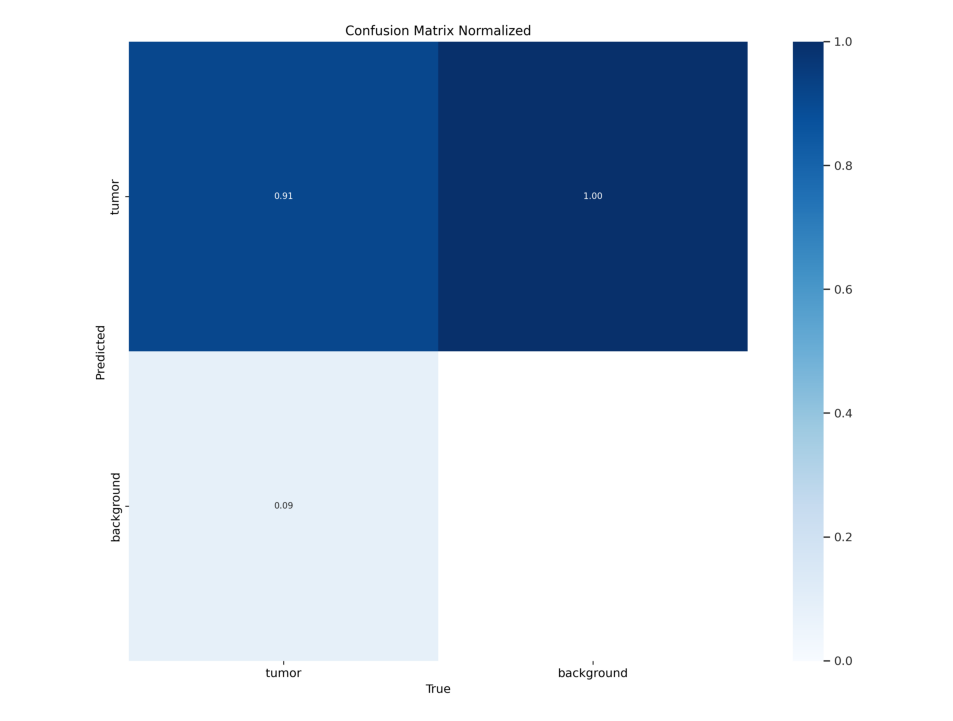

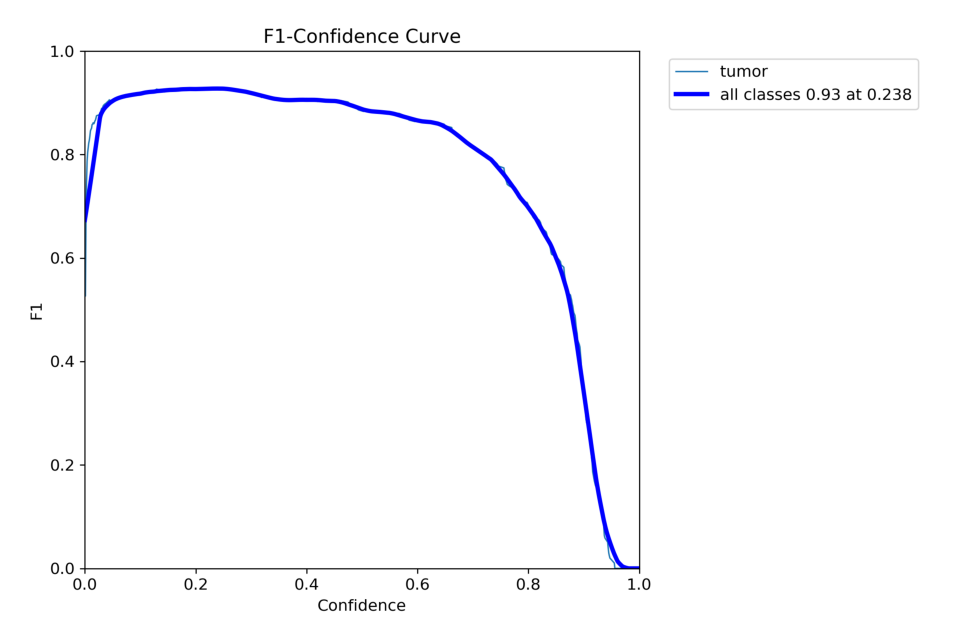

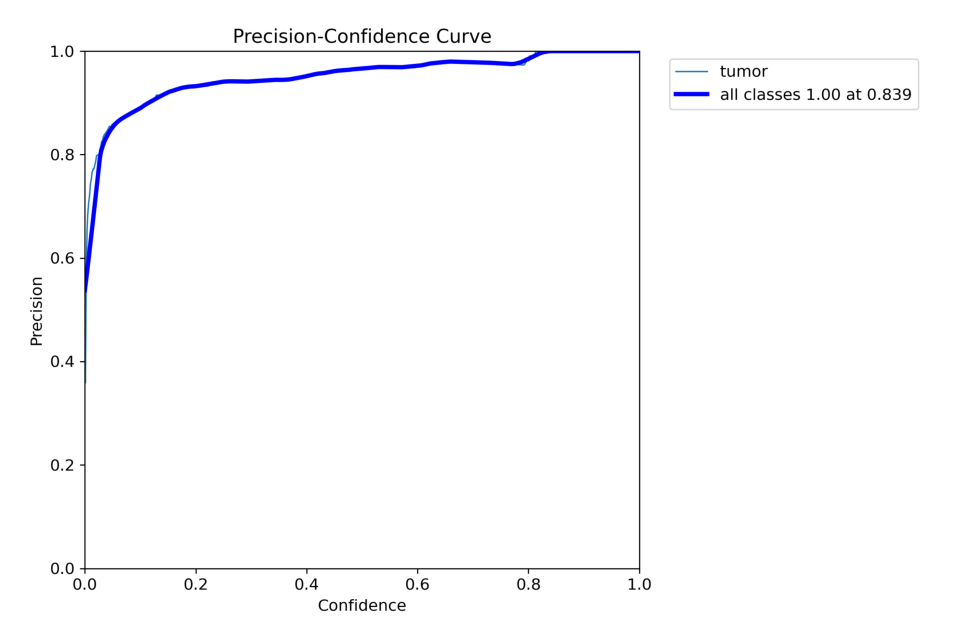

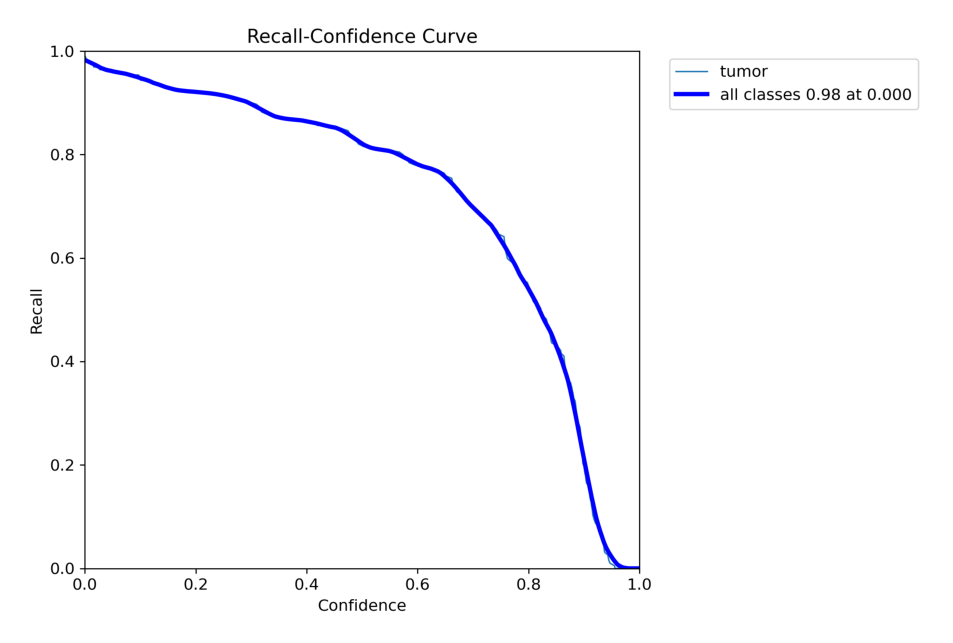

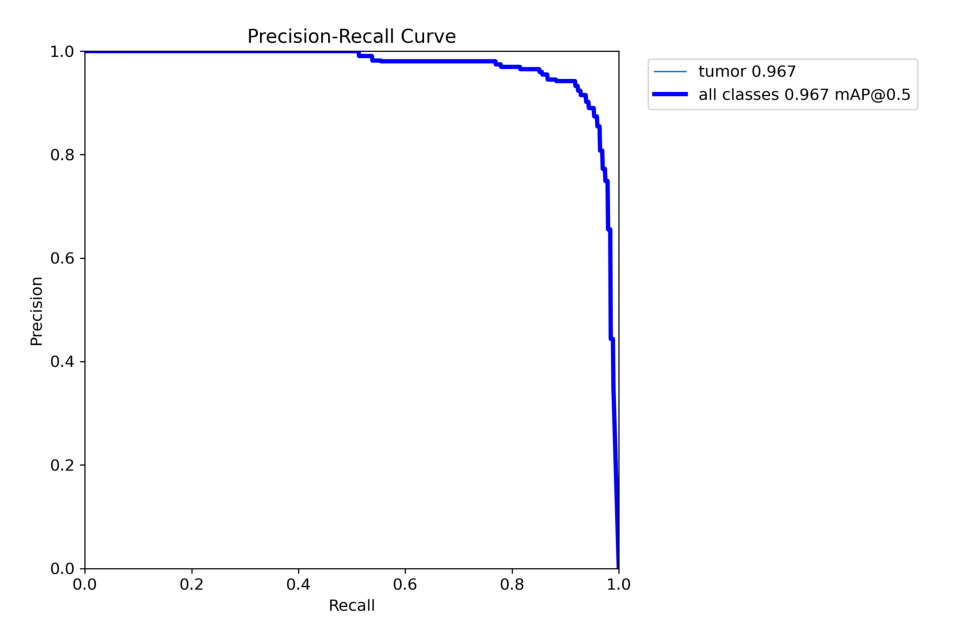

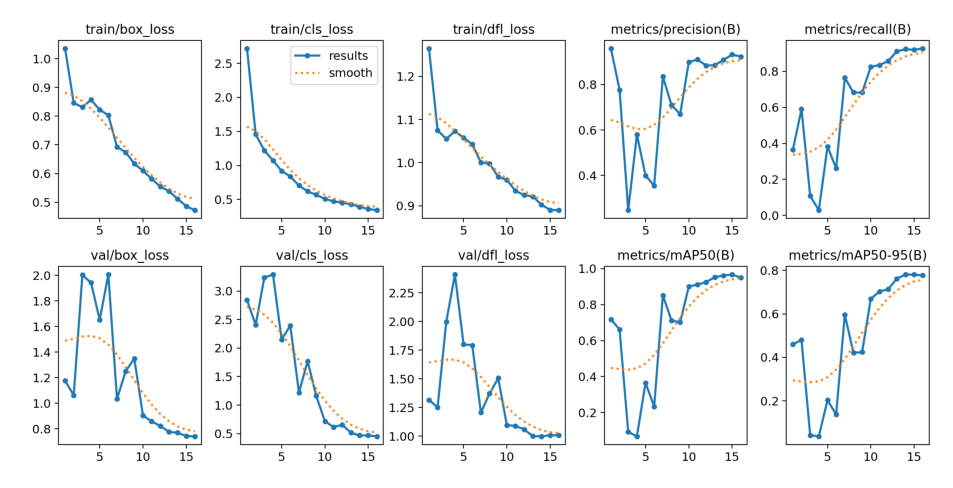

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = './runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


In [ ]:
Result_Train_model = pd.read_csv('/content/runs/detect/train/results.csv')
Result_Train_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
6,7,1053.72,0.69292,0.70407,1.00060,0.83520,0.76410,0.85125,0.59617,1.03332,1.21622,1.20515,0.001257,0.001257,0.001257
7,8,1117.90,0.67425,0.61908,0.99773,0.70944,0.68205,0.71125,0.42132,1.25052,1.77090,1.37119,0.001134,0.001134,0.001134
8,9,1182.73,0.63430,0.56769,0.96706,0.66997,0.68205,0.70227,0.42423,1.34845,1.15990,1.50579,0.001010,0.001010,0.001010
9,10,1245.18,0.60964,0.50940,0.96001,0.89937,0.82500,0.90029,0.66920,0.90443,0.71480,1.09539,0.000886,0.000886,0.000886
10,11,1306.29,0.58169,0.47048,0.93450,0.91051,0.83482,0.91087,0.70248,0.85761,0.61608,1.08993,0.000763,0.000763,0.000763
11,12,1368.42,0.55464,0.45239,0.92480,0.88405,0.85641,0.92483,0.71329,0.82146,0.65385,1.05851,0.000639,0.000639,0.000639
12,13,1433.15,0.53872,0.42883,0.92148,0.88533,0.91063,0.95246,0.76148,0.77643,0.51425,1.00001,0.000515,0.000515,0.000515
13,14,1496.31,0.51199,0.39049,0.90259,0.90850,0.92308,0.96116,0.78085,0.76898,0.46724,0.99836,0.000391,0.000391,0.000391
14,15,1559.21,0.48635,0.36006,0.89034,0.93235,0.91885,0.96694,0.78030,0.74303,0.46744,1.00801,0.000267,0.000267,0.000267
15,16,1621.09,0.47226,0.34121,0.88976,0.92340,0.92727,0.95005,0.77699,0.74097,0.45178,1.00756,0.000144,0.000144,0.000144


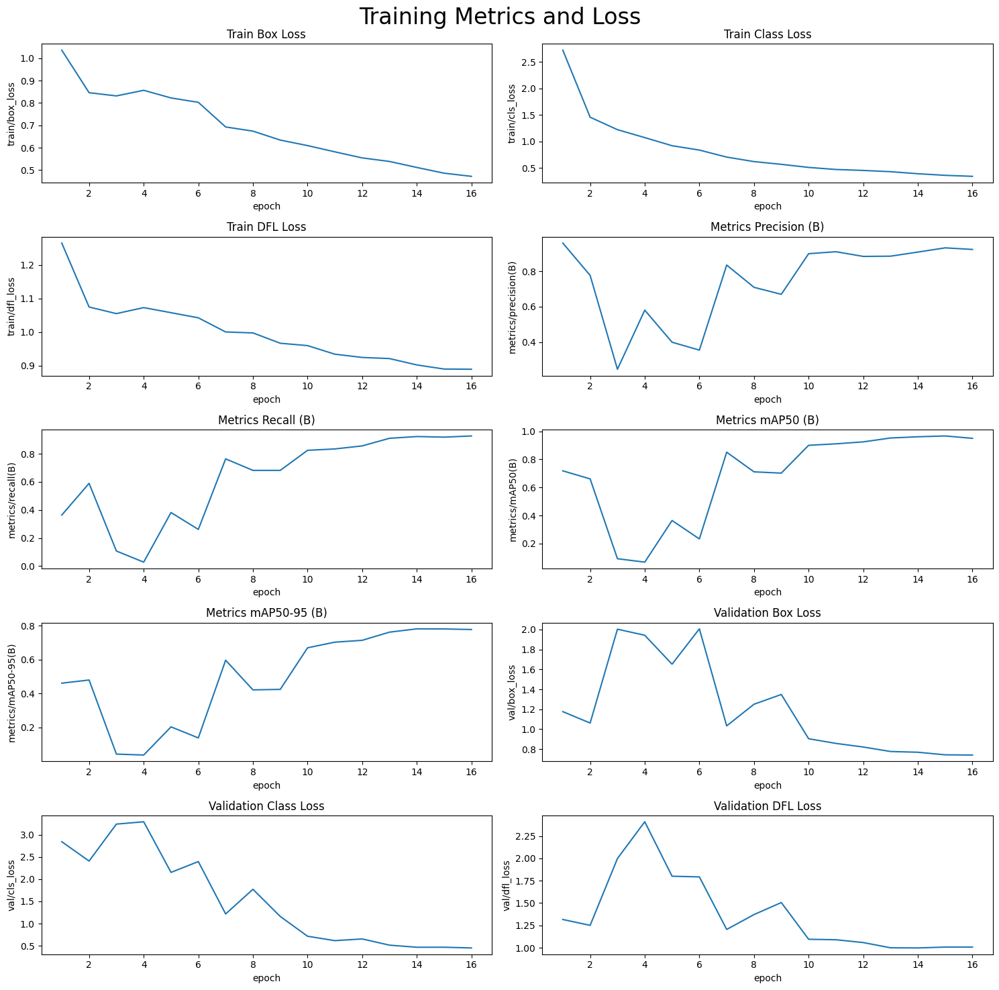

In [ ]:
# Read the results.csv file as a pandas dataframe
Result_Train_model.columns = Result_Train_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Train_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Train_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Train_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Train_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Train_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Train_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Train_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Train_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Train_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Train_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [ ]:
# Evaluating the model on the validset
metrics = Valid_model.val(split = 'train')

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/labels.cache... 2765 images, 153 backgrounds, 1 corrupt: 100%|██████████| 2766/2766 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/train/images/y221_jpg.rf.6b1cfcd2609c06a422d71dfabbfda204.jpg'



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 173/173 [01:19<00:00,  2.17it/s]


                   all       2765       2747      0.963      0.964      0.989       0.91
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val2


In [ ]:
# Loading the best performing model
Valid_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8/valid/labels.cache... 184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  2.66it/s]


                   all        184        195      0.932      0.919      0.967      0.781
Speed: 4.6ms preprocess, 5.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val
precision(B):  0.9323591286180969
metrics/recall(B):  0.9189348599890331
metrics/mAP50(B):  0.9668363585639872
metrics/mAP50-95(B):  0.7805349340372879


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding


0: 640x640 (no detections), 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 12.5ms
Speed: 3.1ms preprocess, 12.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 26.2ms
Speed: 3.5ms preprocess, 26.2ms inference, 7.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 tumors, 27.3ms
Speed: 5.1ms preprocess, 27.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 15.3ms
Speed: 13.4ms preprocess, 15.3ms inference, 33.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 62.9ms
Speed: 8.6ms preprocess, 62.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 49.7ms
Speed: 13.1ms preprocess, 49.7ms inference, 7.9ms postprocess per image at shape (1, 3

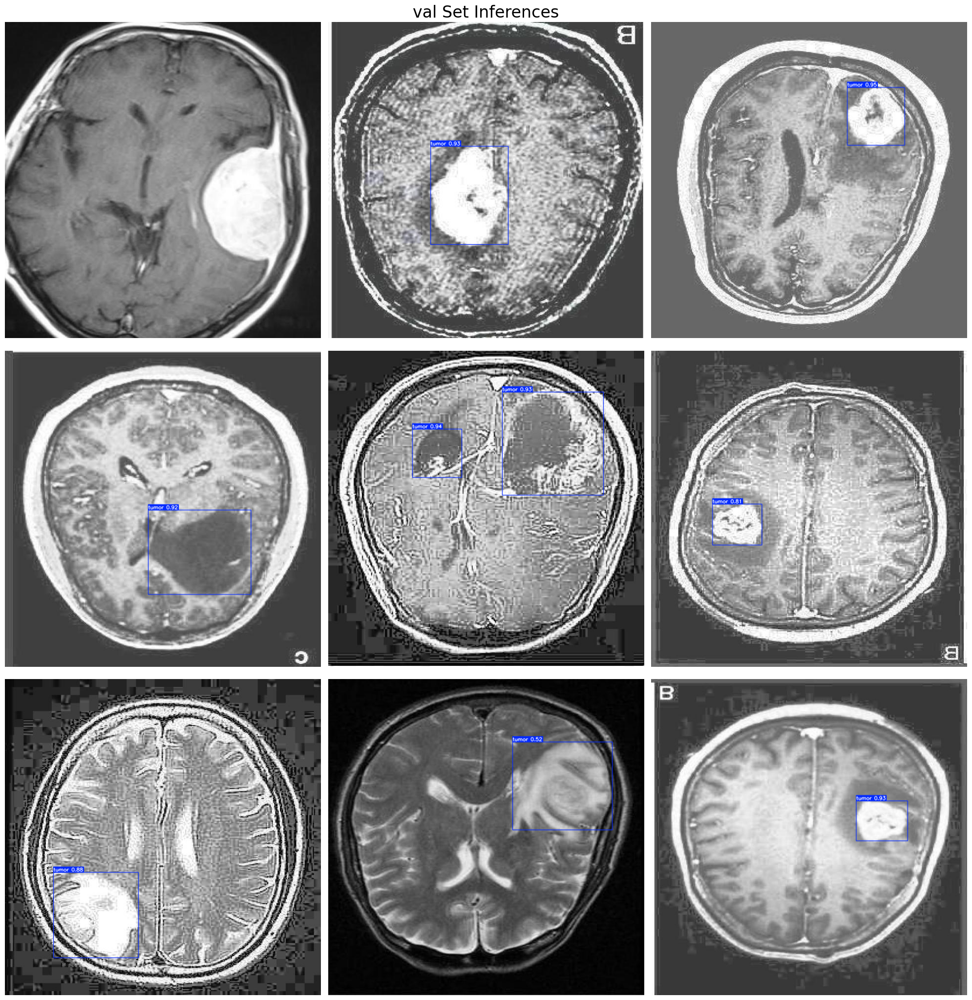

In [ ]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to test images
dataset_path = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('val Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)

                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()



0: 640x640 1 tumor, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 36.0ms
Speed: 2.9ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.1ms
Speed: 3.2ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.4ms
Speed: 3.7ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 9.9ms
Speed: 3.4ms preprocess, 9.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.3ms
Speed: 3.7ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640,

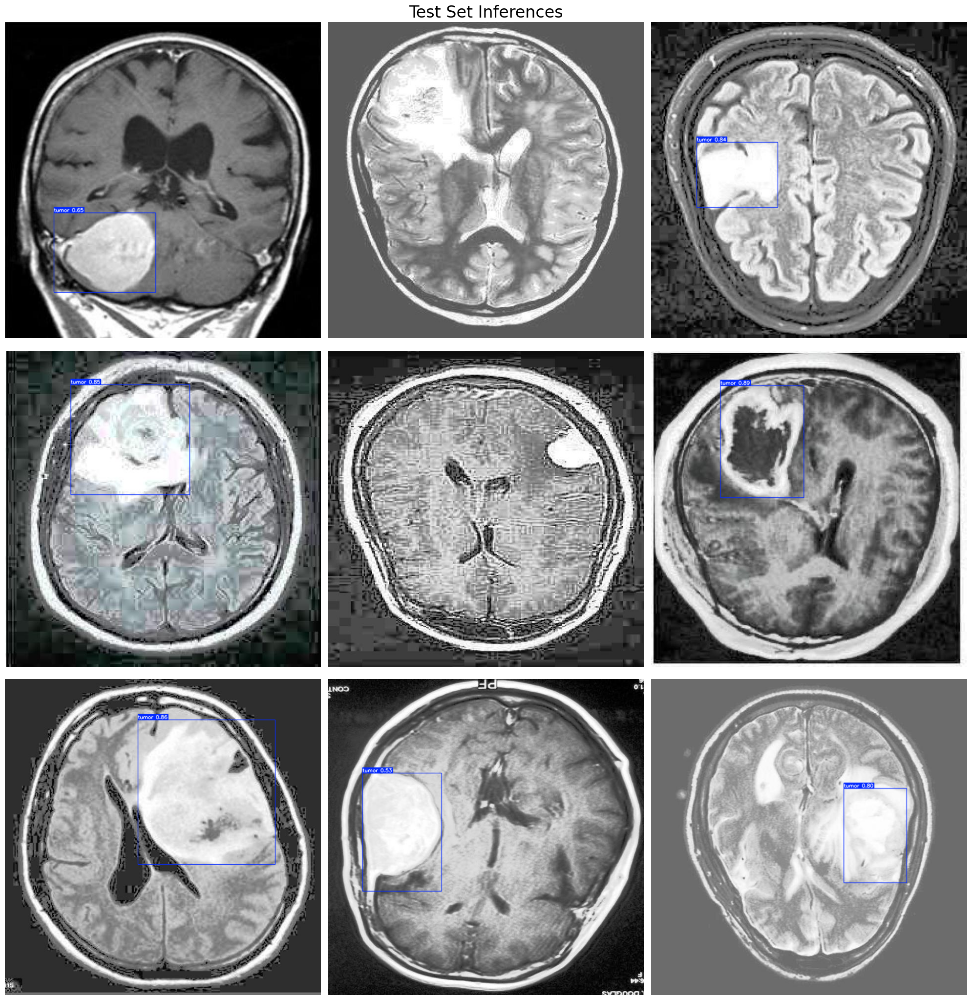

In [ ]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to test images
dataset_path = '/content/drive/MyDrive/Roboflow_Brain_Tumor/brain tumor.v1i.yolov8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Test Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)

                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()
